# Трекинг объектов на видеопотоках

## Feature based methods

### Color feature

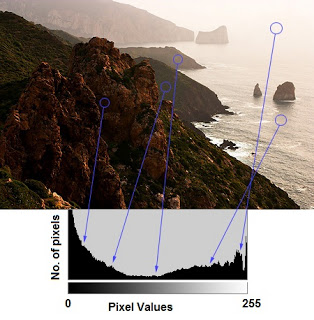

In [13]:
import cv2
import numpy as np

img = cv2.imread('assets/lesson4/p2.jpg')
bgr_planes = cv2.split(img)
histSize = 256
histRange = (0, 256)
accumulate = False
b_hist = cv2.calcHist(bgr_planes, [0], None, [histSize], histRange, accumulate=accumulate)
g_hist = cv2.calcHist(bgr_planes, [1], None, [histSize], histRange, accumulate=accumulate)
r_hist = cv2.calcHist(bgr_planes, [2], None, [histSize], histRange, accumulate=accumulate)

hist = np.concatenate([b_hist, g_hist, r_hist], axis=1)
hist.shape

(256, 3)

### Texture feature

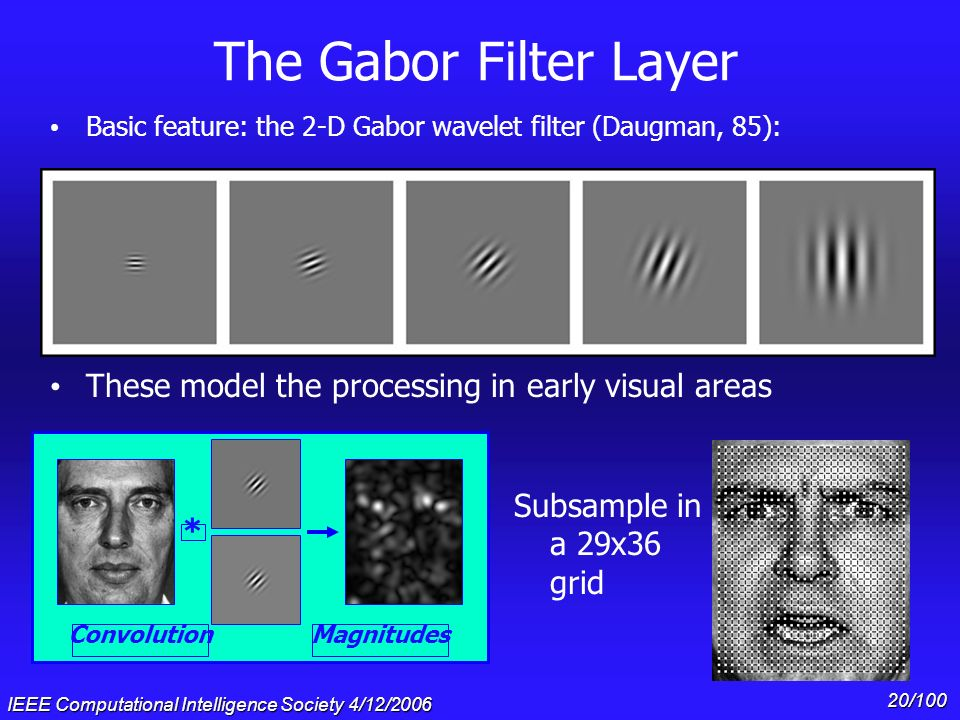

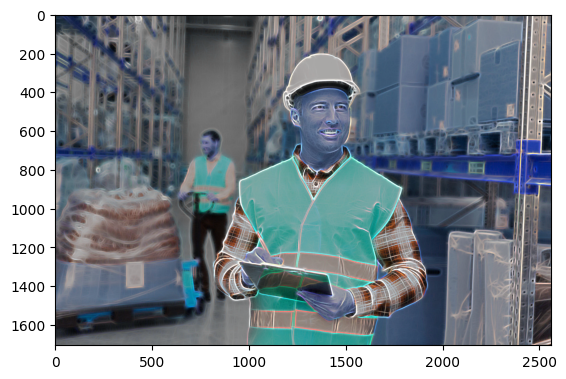

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
def build_filters():
    filters = []
    ksize = 31
    for theta in np.arange(0, np.pi, np.pi / 16):
        kern = cv2.getGaborKernel((ksize, ksize), 4.0, theta, 10.0, 0.5, 0, ktype=cv2.CV_32F)
        kern /= 1.5 * kern.sum()
        filters.append(kern)
    return filters

def process(img, filters):
 accum = np.zeros_like(img)
 for kern in filters:
     fimg = cv2.filter2D(img, cv2.CV_8UC3, kern)
     np.maximum(accum, fimg, accum)
 return accum

img = cv2.imread('assets/lesson4/p2.jpg')
filters = build_filters()

img_ = process(img, filters)

plt.imshow(img_)

### Optical flow

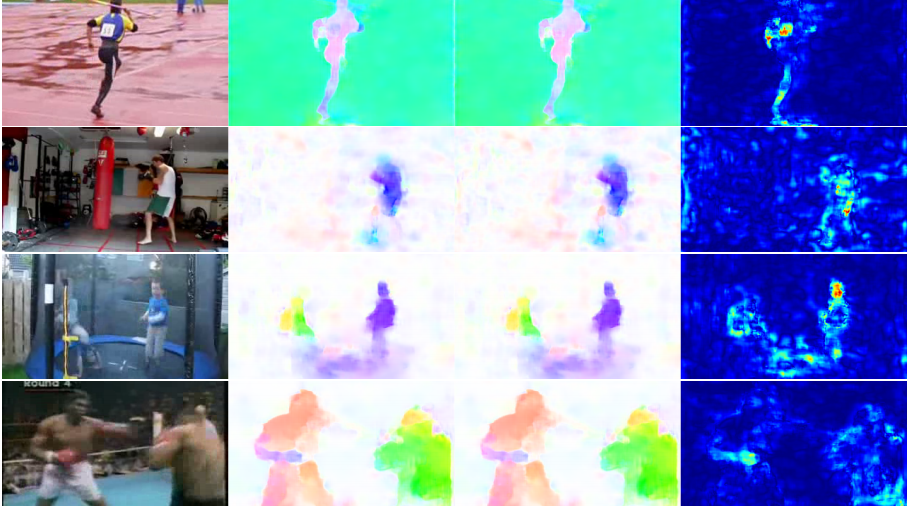

https://habrastorage.org/webt/55/pv/ql/55pvqliwe25q4uz58mc9vhf5z9m.gif

In [22]:
cv2.calcOpticalFlowFarneback, cv2.calcOpticalFlowPyrLK

(<function calcOpticalFlowFarneback>, <function calcOpticalFlowPyrLK>)

## Segmentation based methods

# Bottom-Up Based Method

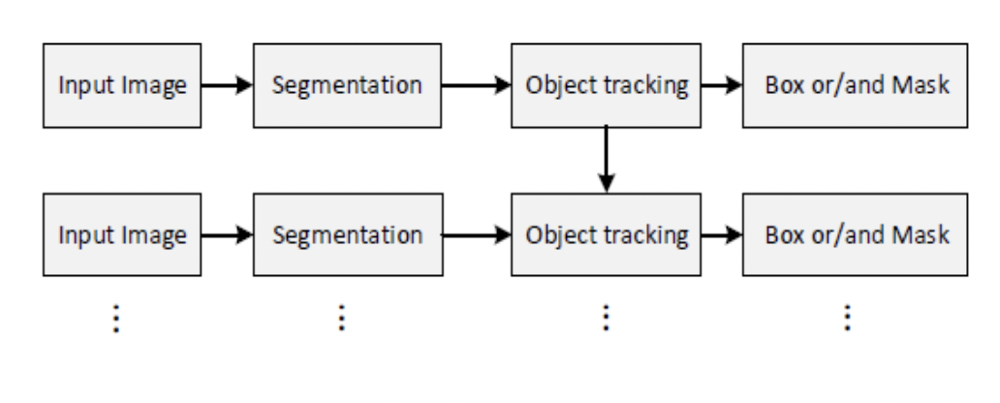

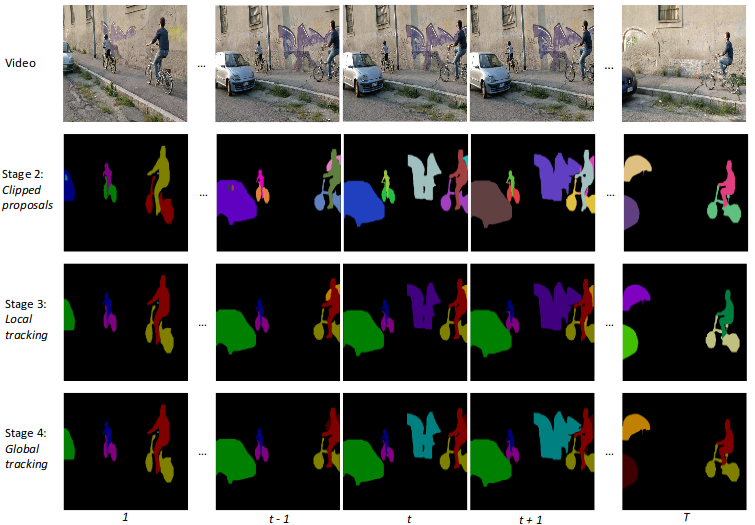

### Joint based methd

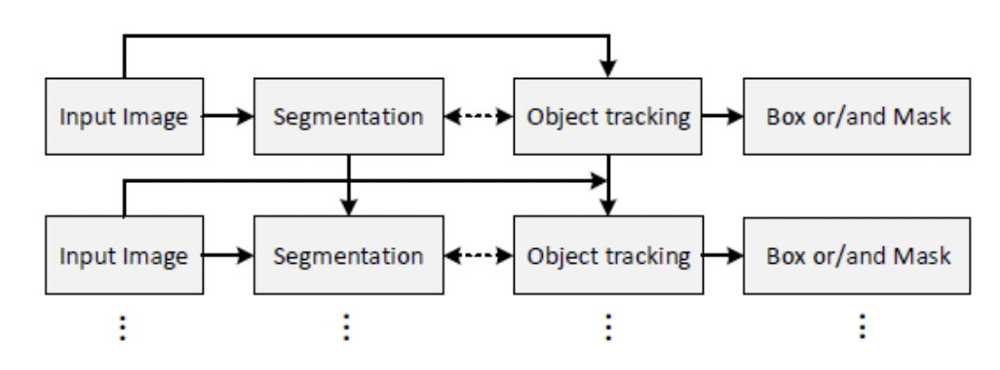

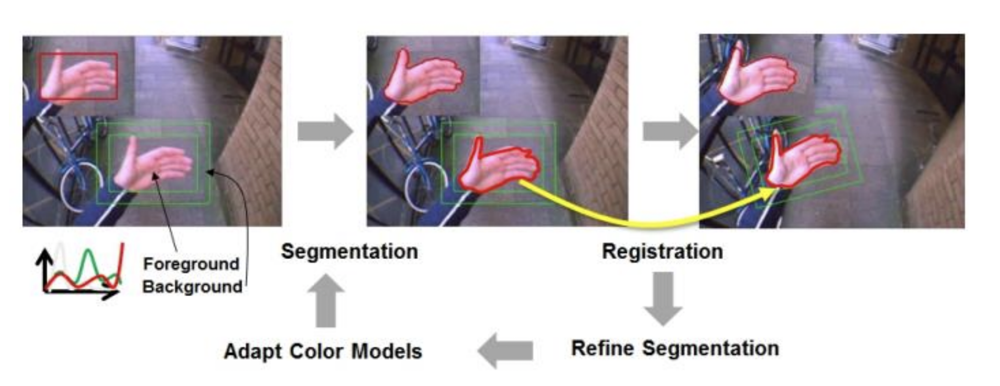

## Estimation Based Methods

### Kalman Filter

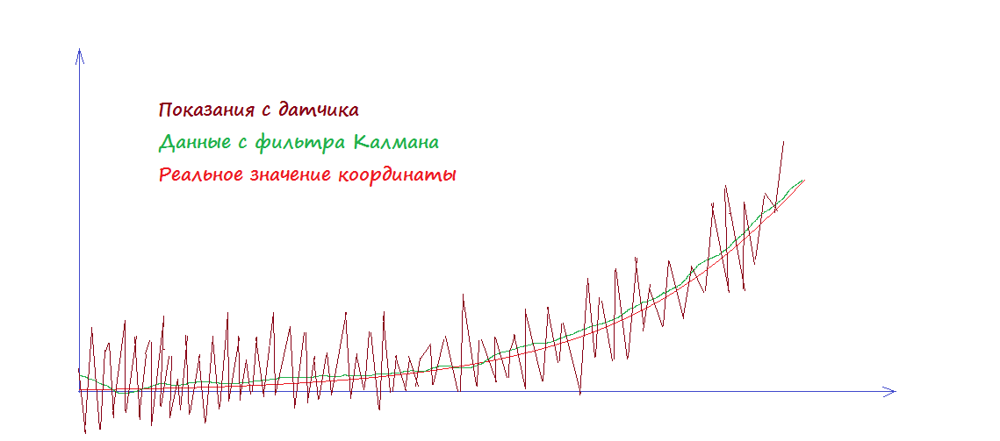

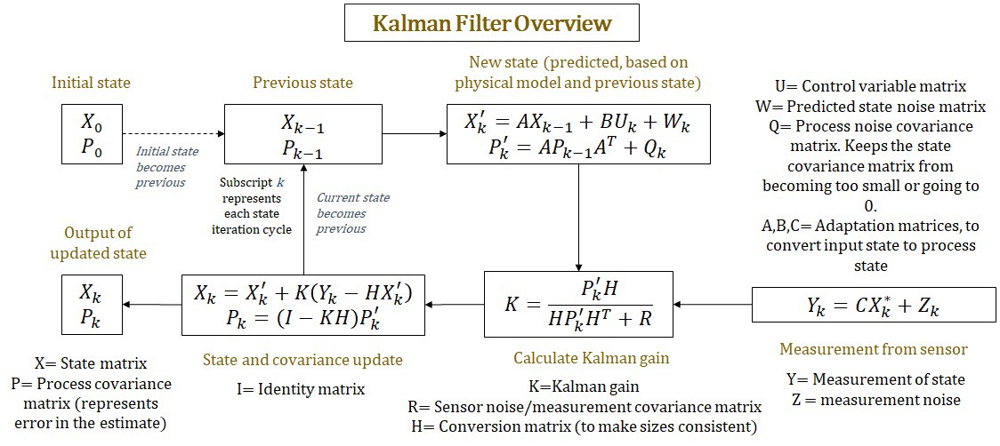

In [12]:
from typing import *

import numpy as np
import scipy.linalg



class KalmanFilterPredictor:
    def __init__(
        self,
        dim: int = 4,
        dt: int = 1,
        position_weight: float = 4.0,
        velocity_weight: float = 100.0
    ):
        self._dim = dim
        self._dt = dt

        self._motion_mat = np.eye(2 * dim, 2 * dim)
        for i in range(dim):
            self._motion_mat[i, dim + i] = dt
        self._update_mat = np.eye(dim, 2 * dim)

        self._std_weight_position = 1. / position_weight
        self._std_weight_velocity = 1. / velocity_weight

    def init(
        self,
        measurement: np.ndarray
    ) -> Tuple[np.ndarray, np.ndarray]:
        mean_pos = measurement
        mean_vel = np.zeros_like(mean_pos)
        mean = np.r_[mean_pos, mean_vel]

        std = [
            2 * self._std_weight_position * measurement[3],
            2 * self._std_weight_position * measurement[3],
            1e-2,
            2 * self._std_weight_position * measurement[3],
            10 * self._std_weight_velocity * measurement[3],
            10 * self._std_weight_velocity * measurement[3],
            1e-5,
            10 * self._std_weight_velocity * measurement[3]]
        covariance = np.diag(np.square(std))
        return mean, covariance

    def predict(
        self,
        mean: np.ndarray,
        covariance: np.ndarray
    ) -> Tuple[np.ndarray, np.ndarray]:
        std_pos = [
            self._std_weight_position * mean[3],
            self._std_weight_position * mean[3],
            1e-2,
            self._std_weight_position * mean[3]]
        std_vel = [
            self._std_weight_velocity * mean[3],
            self._std_weight_velocity * mean[3],
            1e-5,
            self._std_weight_velocity * mean[3]]
        motion_cov = np.diag(np.square(np.r_[std_pos, std_vel]))

        mean = np.dot(self._motion_mat, mean)
        covariance = np.linalg.multi_dot((
            self._motion_mat, covariance, self._motion_mat.T)) + motion_cov

        return mean, covariance

    def project(
        self,
        mean: np.ndarray,
        covariance: np.ndarray
    ) -> Tuple[np.ndarray, np.ndarray]:
        std = [
            self._std_weight_position * mean[3],
            self._std_weight_position * mean[3],
            1e-1,
            self._std_weight_position * mean[3]]
        innovation_cov = np.diag(np.square(std))

        mean = np.dot(self._update_mat, mean)
        covariance = np.linalg.multi_dot((
            self._update_mat, covariance, self._update_mat.T))
        return mean, covariance + innovation_cov

    def update(
        self,
        measurement: np.ndarray,
        mean: np.ndarray,
        covariance: np.ndarray
    ) -> Tuple[np.ndarray, np.ndarray]:
        projected_mean, projected_cov = self.project(mean, covariance)

        chol_factor, lower = scipy.linalg.cho_factor(
            projected_cov, lower=True, check_finite=False)
        kalman_gain = scipy.linalg.cho_solve(
            (chol_factor, lower), np.dot(covariance, self._update_mat.T).T,
            check_finite=False).T
        innovation = measurement - projected_mean

        new_mean = mean + np.dot(innovation, kalman_gain.T)
        new_covariance = covariance - np.linalg.multi_dot((
            kalman_gain, projected_cov, kalman_gain.T))
        return new_mean, new_covariance


In [38]:
predictor = KalmanFilterPredictor()

boxes = np.asarray([
    [0.5, 0.5, 0.25 / 0.25, 0.25],
    [0.55, 0.55, 0.24 / 0.26, 0.26],
    [0.6, 0.6, 0.26 / 0.24, 0.24],
    [0.65, 0.65, 0.25 / 0.24, 0.24],
    [0.7, 0.7, 0.25 / 0.24, 0.24],
])

mean, covariance = predictor.init(boxes[0])

for box in boxes[1:]:
    mean, covariance = predictor.update(box, mean, covariance)
    print(f'predicted box: {predictor.project(*predictor.predict(mean, covariance))[0]}')

predicted box: [0.54       0.54       0.99923839 0.258     ]
predicted box: [0.56573693 0.56573693 1.00006285 0.25027892]
predicted box: [0.59211999 0.59211999 1.00046677 0.24706055]
predicted box: [0.61835399 0.61835399 1.00086292 0.24534359]


## Learning based methods

### Feature extraction Based Methods

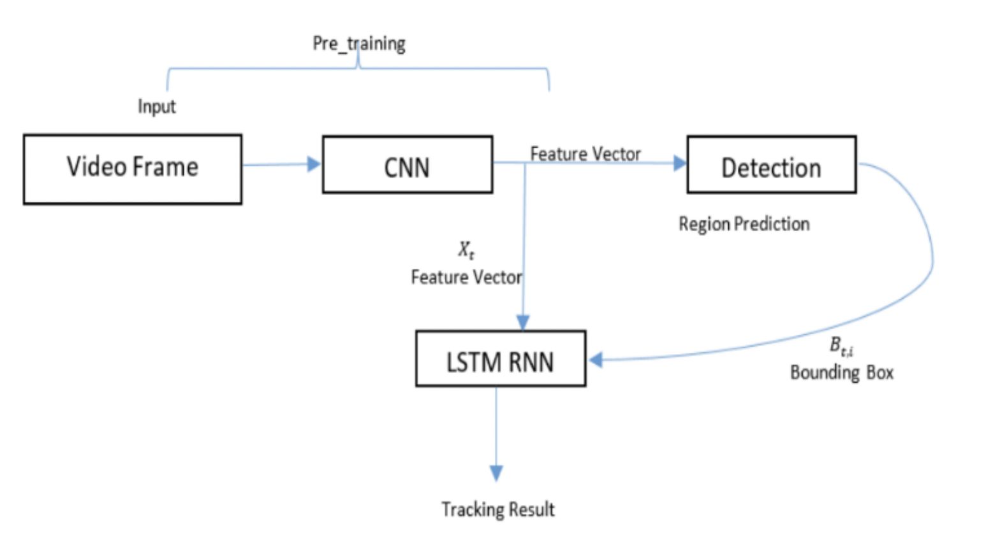

### Siamise methods

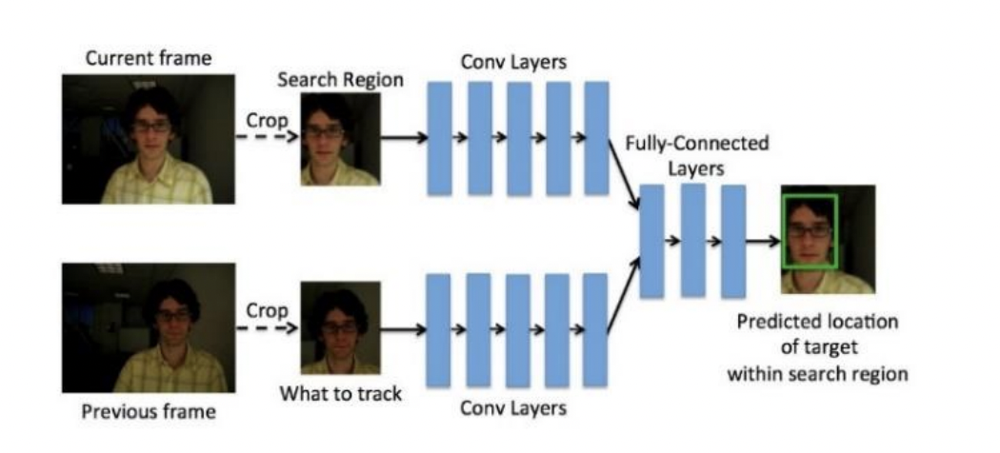

### Patch learning tracker

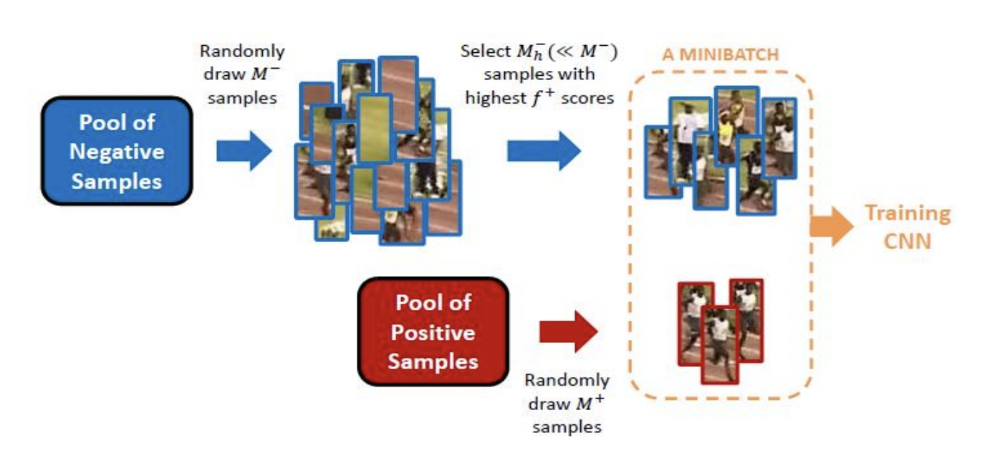

## Reinforcement Learning

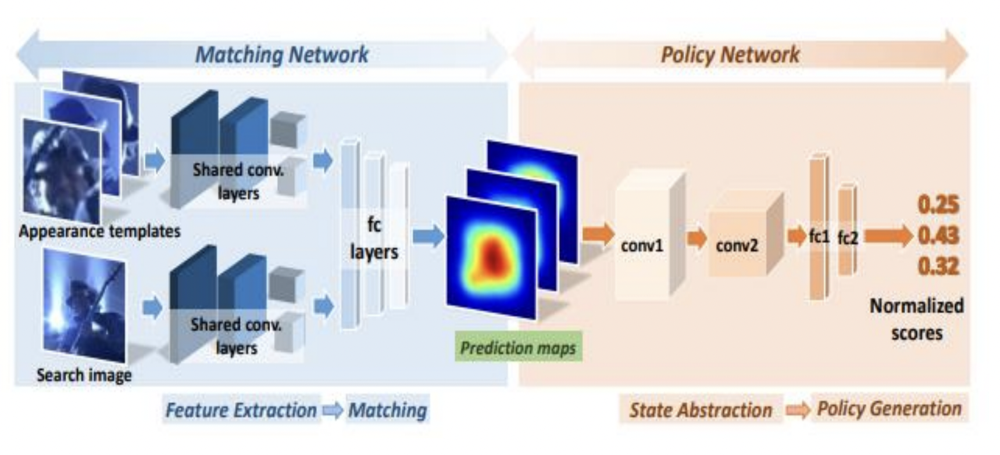

## SORT

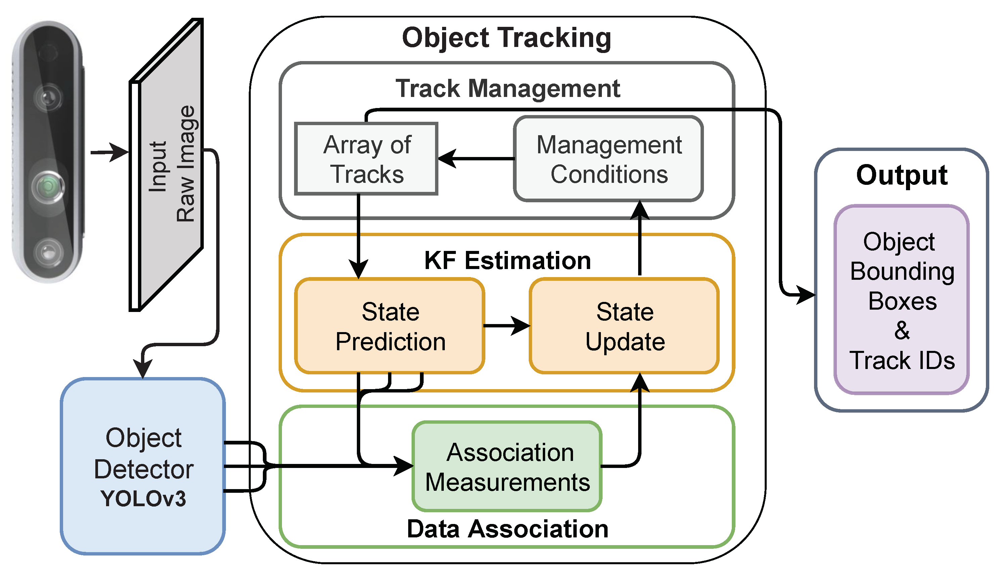

## DeepSORT

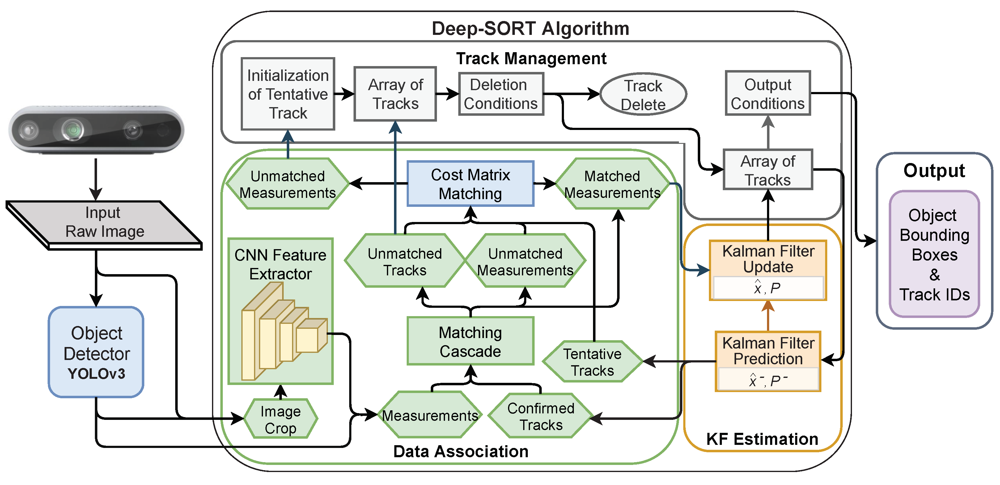

# Code time

In [2]:
import cv2

class VideoCapture(object):
    def __init__(self, path: str, n_skip: int = 0):
        self._path = path
        self._n_skip = n_skip

        self._current_skip = 0
        self._video_capture = cv2.VideoCapture(path)

    def read(self):
        if self._current_skip < self._n_skip:
            self._current_skip += 1
            _ =  self._video_capture.read()
            return self.read()
        self._current_skip = 0
        return self._video_capture.read()

In [3]:
import cv2
import imageio


fig = plt.figure(figsize=(12,12))

video_capture = VideoCapture('assets/lesson4/example1.gif', n_skip=5)

ok, frame = video_capture.read()

frames = []
while True:
    ok, frame = video_capture.read()
    if not ok:
        break
    frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

imageio.mimsave('assets/lesson4/example1_result.gif', frames, duration=1000 // 1)


<Figure size 1200x1200 with 0 Axes>

In [9]:
from typing import *
from abc import ABC, abstractmethod
from uuid import uuid4
import collections
from enum import Enum


class TrackStatus(Enum):
    Tentative = 0
    Active = 1
    Obsolete = 2
    ObsoleteTentative = 3

class BaseTrack(ABC):
    def __init__(
        self,
        detection: Dict,
        timestamp: float,
        meta: Dict,
        detections_buffer_size: int = 1000,
        n_init: int = 0,
        max_age: int = 5,
        min_area: float = 64.0
    ):
        self._timestamp = timestamp
        self._meta = meta
        self._detections = collections.deque(maxlen=detections_buffer_size)
        self._detections.append(detection)
        self._n_init = n_init
        self._max_age = max_age
        self._min_area = min_area

        self._id = uuid4()
        self._hits = 1
        self._age = 1
        self._status = TrackStatus.Active if self._n_init == 0 else TrackStatus.Tentative
        self._time_since_update = 0

    def __str__(self) -> str:
        return f'{self._id}: {self._status}'

    @property
    def actual_detection(self) -> Dict:
        return self._detections[-1]

    @property
    def id(self) -> str:
        return str(self._id)

    @property
    def meta(self) -> Dict:
        return self._meta

    @property
    def time_since_update(self) -> int:
        return self._time_since_update

    def mark_missed(self):
        if self._status == TrackStatus.Tentative:
            self._status = TrackStatus.ObsoleteTentative

        elif self._time_since_update > self._max_age:
            self._status = TrackStatus.Obsolete

    def is_tentative(self):
        return self._status == TrackStatus.Tentative

    def is_active(self):
        return self._status == TrackStatus.Active

    def is_deleted(self):
        return self._status in {TrackStatus.Obsolete, TrackStatus.ObsoleteTentative}

    def predict(self):
        suppose_bbox = self.suppose()
        if suppose_bbox['width'] * suppose_bbox['height'] < self._min_area:
            self._status = TrackStatus.Obsolete

    @abstractmethod
    def update(
        self,
        detection: Dict
    ):
        raise NotImplementedError

    @abstractmethod
    def actual(
        self
    ) -> Dict:
        raise NotImplementedError

    @abstractmethod
    def suppose(
        self
    ) -> Dict:
        raise NotImplementedError



class BaseTracker(ABC):

    @abstractmethod
    def active_tracks(
        self,
    ) -> List[BaseTrack]:
        raise NotImplementedError

    @abstractmethod
    def update(
        self,
        detections: List[Dict],
        timestamp: float,
        metas: List[Dict],
        debug: bool = False
    ) -> Union[List[BaseTrack], Tuple[List[BaseTrack], List[BaseTrack]]]:
        raise NotImplementedError


    @abstractmethod
    def _match(
        self,
        detections: List[Dict],
        **kwargs
    ) -> Tuple[List[Tuple[int, int]], List[int], List[int]]:
        raise NotImplementedError


In [24]:
import numpy as np

class SortTrack(BaseTrack):
    def __init__(
        self,
        detection: Dict,
        timestamp: float,
        predictor: KalmanFilterPredictor,
        meta: Dict,
        detections_buffer_size: int = 1000,
        n_init: int = 0,
        max_age: int = 5,
        min_area: float = 64.0
    ):
        super().__init__(detection, timestamp, meta, detections_buffer_size, n_init, max_age, min_area)

        self._predictor = predictor
        tlwh = np.asarray([detection['bbox']['x'], detection['bbox']['y'], detection['bbox']['width'], detection['bbox']['height']])
        tlwh[:2] -= tlwh[2:] / 2
        tlwh[2] /= tlwh[3]
        self._mean, self._covariance = self._predictor.init(tlwh)

    @property
    def mean(self) -> np.ndarray:
        return self._mean

    @property
    def covariance(self) -> np.ndarray:
        return self._covariance

    def predict(self):
        self._mean, self._covariance = self._predictor.predict(self._mean, self._covariance)
        self._age += 1
        self._time_since_update += 1
        super().predict()

    def update(
        self,
        detection: Dict
    ):
        self._detections.append(detection)
        tlwh = np.asarray([detection['bbox']['x'], detection['bbox']['y'], detection['bbox']['width'], detection['bbox']['height']])
        tlwh[:2] -= tlwh[2:] / 2
        tlwh[2] /= tlwh[3]
        self._mean, self._covariance = self._predictor.update(tlwh, self._mean, self._covariance)

        self._hits += 1
        self._time_since_update = 0
        if self._status == TrackStatus.Tentative and self._hits >= self._n_init:
            self._status = TrackStatus.Active

    def suppose(
        self
    ) -> Dict:
        tlah, _ = self._predictor.project(self._mean, self._covariance)
        tlah[2] *= tlah[3]
        tlah[:2] += tlah[2:] / 2
        return {
            'x': tlah[0],
            'y': tlah[1],
            'width': tlah[2],
            'height': tlah[3],
        }

    def actual(
        self
    ) -> Dict:
        return self._detections[-1]['bbox']


In [25]:
from typing import *

import numpy as np


def _intersection(
    bboxes1: np.ndarray,
    bboxes2: np.ndarray
) -> np.ndarray:
    bboxes1 = np.expand_dims(bboxes1, 1)
    bboxes2 = np.expand_dims(bboxes2, 0)
    xx1 = np.maximum(bboxes1[..., 0], bboxes2[..., 0])
    yy1 = np.maximum(bboxes1[..., 1], bboxes2[..., 1])
    xx2 = np.minimum(bboxes1[..., 2], bboxes2[..., 2])
    yy2 = np.minimum(bboxes1[..., 3], bboxes2[..., 3])
    w = np.maximum(0., xx2 - xx1)
    h = np.maximum(0., yy2 - yy1)
    return w * h

def _convex(
    bboxes1: np.ndarray,
    bboxes2: np.ndarray,
):
    bboxes1 = np.expand_dims(bboxes1, 1)
    bboxes2 = np.expand_dims(bboxes2, 0)
    xx1 = np.minimum(bboxes1[..., 0], bboxes2[..., 0])
    yy1 = np.minimum(bboxes1[..., 1], bboxes2[..., 1])
    xx2 = np.maximum(bboxes1[..., 2], bboxes2[..., 2])
    yy2 = np.maximum(bboxes1[..., 3], bboxes2[..., 3])
    w = np.maximum(0., xx2 - xx1)
    h = np.maximum(0., yy2 - yy1)
    return w * h

def _area(
    bboxes: np.ndarray
) -> np.ndarray:
    return (bboxes[..., 2] - bboxes[..., 0]) * (bboxes[..., 3] - bboxes[..., 1])

def _union(
    bboxes1: np.ndarray,
    bboxes2: np.ndarray,
    intersection: Optional[np.ndarray] = None
) -> np.ndarray:
    bboxes1 = np.expand_dims(bboxes1, 1)
    bboxes2 = np.expand_dims(bboxes2, 0)
    bboxes1_area = _area(bboxes1)
    bboxes2_area = _area(bboxes2)
    bboxes_intersection = _intersection(bboxes1, bboxes2) if intersection is None else intersection
    return bboxes1_area + bboxes2_area - bboxes_intersection


def intersection_batch(
    bboxes1: np.ndarray,
    bboxes2: np.ndarray
) -> np.ndarray:
    if len(bboxes1) == 0:
        return np.zeros((0, len(bboxes2)))
    if len(bboxes2) == 0:
        return np.zeros((len(bboxes1), 0))
    bboxes1 = np.stack([
        np.array([bbox['x'], bbox['y'], bbox['x'] + bbox['width'], bbox['y'] + bbox['height']]) for bbox in bboxes1
    ])
    bboxes2 = np.stack([
        np.array([bbox['x'], bbox['y'], bbox['x'] + bbox['width'], bbox['y'] + bbox['height']]) for bbox in bboxes2
    ])
    return _intersection(bboxes1, bboxes2)

def area_batch(
    bboxes: List[Dict]
) -> np.ndarray:
    if len(bboxes) == 0:
        return np.zeros((0, ))
    bboxes = np.stack([
        np.array([bbox['x'], bbox['y'], bbox['x'] + bbox['width'], bbox['y'] + bbox['height']]) for bbox in bboxes
    ])
    return _area(bboxes)


def iou_batch(
    bboxes1: List[Dict],
    bboxes2: List[Dict],
    eps = 1e-8
) -> np.ndarray:
    if len(bboxes1) == 0:
        return np.zeros((0, len(bboxes2)))
    if len(bboxes2) == 0:
        return np.zeros((len(bboxes1), 0))
    bboxes1 = np.stack([
        np.array([bbox['x'], bbox['y'], bbox['x'] + bbox['width'], bbox['y'] + bbox['height']]) for bbox in bboxes1
    ])
    bboxes2 = np.stack([
        np.array([bbox['x'], bbox['y'], bbox['x'] + bbox['width'], bbox['y'] + bbox['height']]) for bbox in bboxes2
    ])

    intersection = _intersection(bboxes1, bboxes2)
    union = _union(bboxes1, bboxes2, intersection)

    return intersection / (union + eps)

def giou_batch(
    bboxes1: List[Dict],
    bboxes2: List[Dict],
    eps = 1e-8
) -> np.ndarray:
    if len(bboxes1) == 0:
        return np.zeros((0, len(bboxes2)))
    if len(bboxes2) == 0:
        return np.zeros((len(bboxes1), 0))
    bboxes1 = np.stack([
        np.array([bbox['x'], bbox['y'], bbox['x'] + bbox['width'], bbox['y'] + bbox['height']]) for bbox in bboxes1
    ])
    bboxes2 = np.stack([
        np.array([bbox['x'], bbox['y'], bbox['x'] + bbox['width'], bbox['y'] + bbox['height']]) for bbox in bboxes2
    ])

    intersection = _intersection(bboxes1, bboxes2)
    union = _union(bboxes1, bboxes2, intersection)
    convex = _convex(bboxes1, bboxes2)
    iou = intersection / (union + eps)

    return iou - (convex - union) / (convex + eps)


In [26]:
try:
    import lap
    def linear_assignment(cost_matrix: np.ndarray) -> np.ndarray:
        _, x, y = lap.lapjv(cost_matrix, extend_cost=True)
        return np.array([[y[i],i] for i in x if i >= 0])
except ImportError:
    from scipy.optimize import linear_sum_assignment
    def linear_assignment(cost_matrix: np.ndarray) -> np.ndarray:
        x, y = linear_sum_assignment(cost_matrix)
        return np.array(list(zip(x, y)))

class BboxDistance(Enum):
    IOU = 'iou'
    GIOU = 'giou'

def _build_distance_func(
    bbox_dinstance_func: BboxDistance
) -> Callable:
    if bbox_dinstance_func == BboxDistance.IOU:
        return iou_batch
    elif bbox_dinstance_func == BboxDistance.GIOU:
        return giou_batch
    raise NotImplementedError

class SortTracker(BaseTracker):
    def __init__(
        self,
        predictor_kwargs: Dict,
        max_age: int = 30,
        iou_threshold: float = 0.3,
        distance_func: BboxDistance = BboxDistance.IOU,
        mix_actual_suppose_bboxes: bool = False
    ):
        self._max_age = max_age
        self._predictor = KalmanFilterPredictor(**predictor_kwargs)
        self._iou_threshold = iou_threshold
        self._distance_func = _build_distance_func(distance_func)
        self._mix_actual_suppose_bboxes = mix_actual_suppose_bboxes

        self._tracks = []

    def active_tracks(
        self
    ) -> List[SortTrack]:
        return [
            track for track in self._tracks if track.is_active()
        ]

    def _clean_tracks(
        self
    ):
        for track_idx in range(len(self._tracks) - 1, -1, -1):
            if self._tracks[track_idx].is_deleted():
                del self._tracks[track_idx]

    def update(
        self,
        detections: List[Dict],
        timestamp: float,
        metas: List[Dict],
        debug: bool = False
    ) -> Union[List[SortTrack], Tuple[List[SortTrack], List[SortTrack]]]:
        for track in self._tracks:
            track.predict()

        match_objects = []
        matches, unmatched_tracks, unmatched_detections = self._match(detections)
        for detection_idx, track_idx in matches:
            self._tracks[track_idx].update(detections[detection_idx])
            if self._tracks[track_idx].is_active():
                match_objects.append(self._tracks[track_idx])
        unmatched_objects = []
        for track_idx in unmatched_tracks:
            self._tracks[track_idx].mark_missed()
            if debug:
                unmatched_objects.append(self._tracks[track_idx])
        for detection_idx in unmatched_detections:
            track = SortTrack(
                detection=detections[detection_idx],
                timestamp=timestamp,
                predictor=self._predictor,
                meta=dict(**metas[detection_idx], **detections[detection_idx]['meta']),
                max_age=self._max_age
            )
            self._tracks.append(track)
            if track.is_active():
                match_objects.append(track)
        self._clean_tracks()
        return (match_objects, unmatched_objects) if debug else match_objects

    def _distance_cost_matrix(
        self,
        detections: List[Dict],
        tracks: List[SortTrack]
    ) -> np.ndarray:
        bboxes = [detection['bbox'] for detection in detections]
        cost_matrix = self._distance_func(bboxes, [track.suppose() for track in tracks])
        if self._mix_actual_suppose_bboxes:
            actual_cost_matrix = self._distance_func(bboxes, [track.actual() for track in tracks])
            cost_matrix = np.maximum(cost_matrix, actual_cost_matrix)
        return cost_matrix

    def _match(
        self,
        detections: List[Dict],
        force_tracks: Optional[List[SortTrack]] = None
    ) -> Tuple[List[Tuple[int, int]], List[int], List[int]]:
        tracks = self._tracks if force_tracks is None else force_tracks
        iou = self._distance_cost_matrix(detections, tracks)
        matched_indices = linear_assignment(-iou) if min(iou.shape) > 0 else np.empty(shape=(0,2))
        unmatched_detections = []
        for det_idx in range(len(detections)):
            if det_idx not in matched_indices[:, 0]:
                unmatched_detections.append(det_idx)

        unmatched_trackers = []
        for track_idx in range(len(tracks)):
            if track_idx not in matched_indices[:, 1]:
                unmatched_trackers.append(track_idx)

        matches = []
        for idx in matched_indices:
            idx = idx.tolist()
            if iou[idx[0], idx[1]] < self._iou_threshold:
                unmatched_detections.append(idx[0])
                unmatched_trackers.append(idx[1])
            else:
                matches.append((idx[0], idx[1]))

        return matches, unmatched_trackers, unmatched_detections


In [27]:
class DeepSortTrack(SortTrack):
    def __init__(
        self,
        detection: Dict,
        timestamp: float,
        predictor: KalmanFilterPredictor,
        meta: Dict,
        detections_buffer_size: int = 1000,
        n_init: int = 0,
        max_age: int = 5,
        embeddings_buffer_size: int = 32,
        min_area: float = 64.0
    ):
        super().__init__(detection, timestamp, predictor, meta, detections_buffer_size, n_init, max_age, min_area)

        self._embeddings = collections.deque(maxlen=embeddings_buffer_size)
        self._embeddings.append(meta['embedding'])

    def update(
        self,
        detection: Dict,
        meta: Dict[str, Any]
    ):
        super().update(detection=detection)
        self._embeddings.append(meta['embedding'])
        self._meta.update(meta)

    @property
    def embeddings(self) -> Deque[Dict]:
        return self._embeddings

    @embeddings.setter
    def embeddings(self, embeddings):
        self._embeddings = embeddings


In [28]:
class DeepSortTracker(SortTracker):
    def __init__(
        self,
        predictor_kwargs: Dict,
        max_age: int = 30,
        iou_threshold: float = 0.3,
        bbox_distance_func: BboxDistance = BboxDistance.IOU,
        mix_actual_suppose_bboxes: bool = False,
    ):
        super().__init__(
            predictor_kwargs=predictor_kwargs, max_age=max_age, iou_threshold=iou_threshold, distance_func=bbox_distance_func,
            mix_actual_suppose_bboxes=mix_actual_suppose_bboxes
        )


    def _clean_tracks(
        self
    ):
        self._nn_matcher.delete(
            [track.id for track in self._tracks if track.is_deleted()]
        )

        super()._clean_tracks()

    def update(
        self,
        detections: List[Dict],
        timestamp: float,
        metas: List[Dict],
        debug: bool = False
    ) -> Union[List[DeepSortTrack], Tuple[List[DeepSortTrack], List[DeepSortTrack]]]:
        ...

    def _match(
        self,
        detections: List[Dict],
        embeddings: List[np.array]
    ) -> Tuple[List[Tuple[int, int]], List[int], List[int]]:
        ...


In [85]:
video_capture = VideoCapture('assets/lesson4/example1.gif', n_skip=5)

ok, frame = video_capture.read()

frames = []
while True:
    ok, frame = video_capture.read()
    if not ok:
        break
    frames.append(frame)

In [86]:
from ultralytics import YOLO
import cv2

model = YOLO("yolov8l.pt")


0: 352x640 11 persons, 1 snowboard, 196.4ms
Speed: 1.0ms preprocess, 196.4ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)


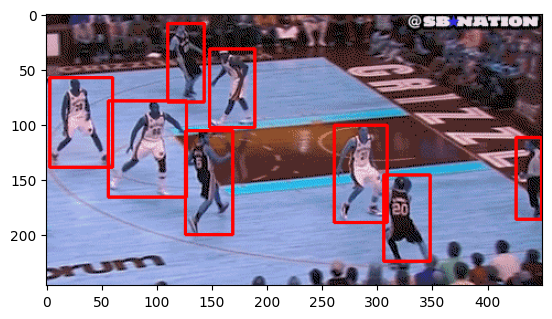

In [87]:
results = model(frames[2])
bboxes = results[0].boxes.xyxy[(results[0].boxes.cls == 0) * (results[0].boxes.conf > 0.5)].numpy().astype('int32').tolist()

image = frames[2].copy()
for box in bboxes:
    image = cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (255, 0, 0), 2)

plt.imshow(image)

In [88]:
tracker = SortTracker(
    predictor_kwargs=dict(dim=4),
    max_age=10,
    iou_threshold=0.1,
    mix_actual_suppose_bboxes=False
)

In [98]:
new_frames = []

track_id = None

for idx, frame in enumerate(frames):
    results = model(frame)
    bboxes = results[0].boxes.xyxy[(results[0].boxes.cls == 0) * (results[0].boxes.conf > 0.5)].numpy().astype('float32')
    bboxes[:, 2:] -= bboxes[:, :2]
    bboxes = bboxes.tolist()
    detections = [
        dict(bbox=dict(x=bbox[0], y=bbox[1], width=bbox[2], height=bbox[3]), meta=dict()) for bbox in bboxes
    ]

    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    tracks, unmatched_tracks = tracker.update(detections, idx, metas=[dict() for _ in detections], debug=True)

    track_id = tracks[2].id if track_id is None else track_id
    for track in tracks:
        bbox = track.actual()
        track_id = str(track.id)[:4]

        frame = cv2.rectangle(frame, (int(bbox['x']), int(bbox['y'])), (int(bbox['x'] + bbox['width']), int(bbox['y'] + bbox['height'])), (0, 255, 0), 2)

        frame = cv2.putText(
            frame,
            track_id,
            (int(bbox['x']), int(bbox['y'] + 5.0)),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            (255, 255, 100),
            2,
            cv2.LINE_AA
        )

    new_frames.append(frame)


0: 352x640 11 persons, 217.8ms
Speed: 3.8ms preprocess, 217.8ms inference, 0.6ms postprocess per image at shape (1, 3, 352, 640)

0: 352x640 11 persons, 1 baseball glove, 192.4ms
Speed: 1.1ms preprocess, 192.4ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 640)

0: 352x640 11 persons, 1 snowboard, 195.6ms
Speed: 0.9ms preprocess, 195.6ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 640)

0: 352x640 13 persons, 1 snowboard, 2 baseball gloves, 200.8ms
Speed: 0.8ms preprocess, 200.8ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)

0: 352x640 11 persons, 1 baseball glove, 202.9ms
Speed: 0.8ms preprocess, 202.9ms inference, 0.6ms postprocess per image at shape (1, 3, 352, 640)

0: 352x640 11 persons, 192.7ms
Speed: 0.8ms preprocess, 192.7ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 640)

0: 352x640 9 persons, 196.9ms
Speed: 1.0ms preprocess, 196.9ms inference, 0.6ms postprocess per image at shape (1, 3, 352, 640)

0: 352x64

In [99]:
imageio.mimsave('assets/lesson4/example1_result_sort.gif', new_frames, duration=1000 // 1)